# Loading data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import scipy as sp

In [2]:
df = pd.read_csv('data.csv', sep=';')

In [3]:
df.head()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume,quality
0,106.476184,80.617,7.124,3.16,74.83,886.900000,904.000000,116.9,104.300000,145.6,922.3,8.82,18.73,1.0
1,105.505000,81.362,6.968,3.16,74.81,919.409791,935.900000,113.9,104.900000,145.6,930.5,8.59,18.73,1.0
2,105.505000,80.411,6.864,4.08,74.81,908.600000,902.344823,120.5,106.503496,147.0,933.1,8.80,18.98,1.0
3,106.474827,81.162,6.864,3.16,74.82,879.410871,902.033653,127.3,104.900000,145.6,922.3,8.85,18.73,1.0
4,106.466140,81.471,6.864,3.22,74.83,885.644260,902.821269,120.5,106.700000,145.6,917.5,8.80,18.75,1.0


In [15]:
df.columns

Index(['Melt temperature', 'Mold temperature', 'time_to_fill',
       'ZDx - Plasticizing time', 'ZUx - Cycle time', 'SKx - Closing force',
       'SKs - Clamping force peak value',
       'Ms - Torque peak value current cycle',
       'Mm - Torque mean value current cycle',
       'APSs - Specific back pressure peak value',
       'APVs - Specific injection pressure peak value',
       'CPn - Screw position at the end of hold pressure', 'SVo - Shot volume',
       'quality'],
      dtype='object')

### Lets check simple statistics

In [5]:
df.describe()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume,quality
count,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000
mean,106.892040,81.326023,7.459043,3.234173,75.218794,901.974834,919.351778,116.716747,104.163904,146.230048,900.972846,8.808863,18.756285,2.461751
std,5.615773,0.428813,1.688106,0.343230,0.432761,11.098192,10.780023,5.029085,4.802195,0.804894,25.519215,0.097238,0.095528,1.123611
min,81.747000,78.409000,6.084000,2.780000,74.780000,876.700000,894.800000,94.200000,76.500000,144.800000,780.500000,8.330000,18.510000,1.000000
25%,105.914500,81.123500,6.292000,3.000000,74.820000,893.600000,914.400000,114.200000,103.550000,145.600000,886.650000,8.770000,18.710000,1.000000
50%,106.089000,81.327000,6.968000,3.192600,74.830000,902.400000,918.800000,116.900000,105.200000,146.100000,906.800000,8.820000,18.750000,2.000000
75%,106.263000,81.441000,7.124000,3.290000,75.650000,909.400000,926.300000,120.200000,106.531415,146.700000,918.900000,8.850000,18.790000,4.000000
max,155.032000,82.159000,11.232000,6.610000,75.790000,930.600000,946.500000,130.300000,114.900000,150.500000,943.000000,9.060000,19.230000,4.000000


# Clearing the data

## First of all lets check our data for null values

In [17]:
df1 = df.dropna()

In [7]:
df1.describe()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume,quality
count,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000
mean,106.892040,81.326023,7.459043,3.234173,75.218794,901.974834,919.351778,116.716747,104.163904,146.230048,900.972846,8.808863,18.756285,2.461751
std,5.615773,0.428813,1.688106,0.343230,0.432761,11.098192,10.780023,5.029085,4.802195,0.804894,25.519215,0.097238,0.095528,1.123611
min,81.747000,78.409000,6.084000,2.780000,74.780000,876.700000,894.800000,94.200000,76.500000,144.800000,780.500000,8.330000,18.510000,1.000000
25%,105.914500,81.123500,6.292000,3.000000,74.820000,893.600000,914.400000,114.200000,103.550000,145.600000,886.650000,8.770000,18.710000,1.000000
50%,106.089000,81.327000,6.968000,3.192600,74.830000,902.400000,918.800000,116.900000,105.200000,146.100000,906.800000,8.820000,18.750000,2.000000
75%,106.263000,81.441000,7.124000,3.290000,75.650000,909.400000,926.300000,120.200000,106.531415,146.700000,918.900000,8.850000,18.790000,4.000000
max,155.032000,82.159000,11.232000,6.610000,75.790000,930.600000,946.500000,130.300000,114.900000,150.500000,943.000000,9.060000,19.230000,4.000000


#### after deleting null values rows, we have same amount of rows, which means our data is clear for nulls

## Lets remove duplicates from our data

In [18]:
df1 = df1.drop_duplicates()

In [9]:
df1.count()

Melt temperature                                    1451
Mold temperature                                    1451
time_to_fill                                        1451
ZDx - Plasticizing time                             1451
ZUx - Cycle time                                    1451
SKx - Closing force                                 1451
SKs - Clamping force peak value                     1451
Ms - Torque peak value current cycle                1451
Mm - Torque mean value current cycle                1451
APSs - Specific back pressure peak value            1451
APVs - Specific injection pressure peak value       1451
CPn - Screw position at the end of hold pressure    1451
SVo - Shot volume                                   1451
quality                                             1451
dtype: int64

#### How we can see there were no duplicates!

# Trajectories 
Lets create scatter plots to see how our data is distributed

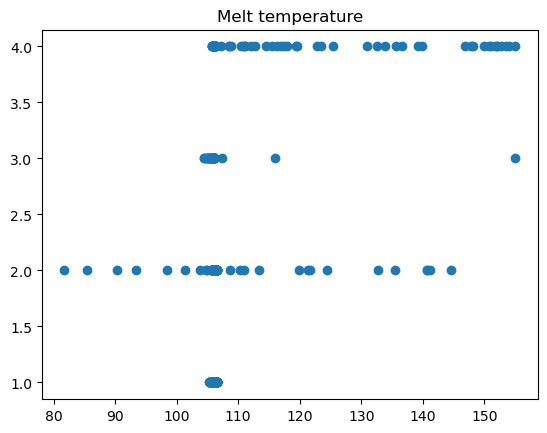

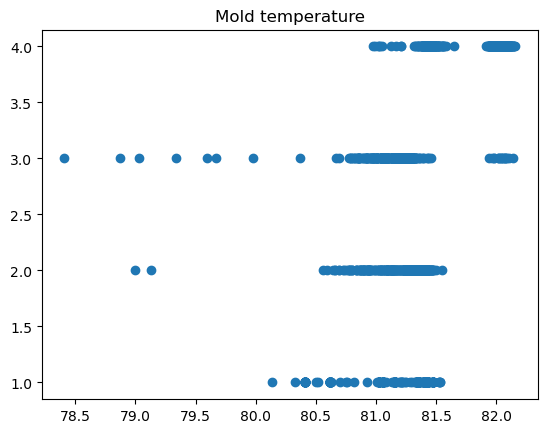

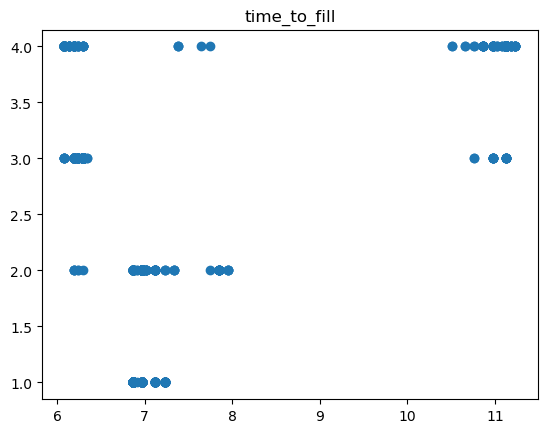

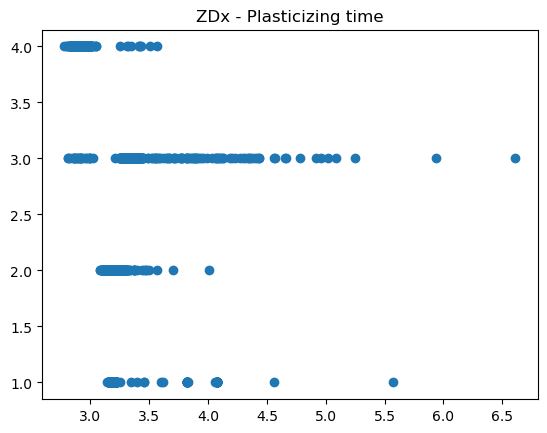

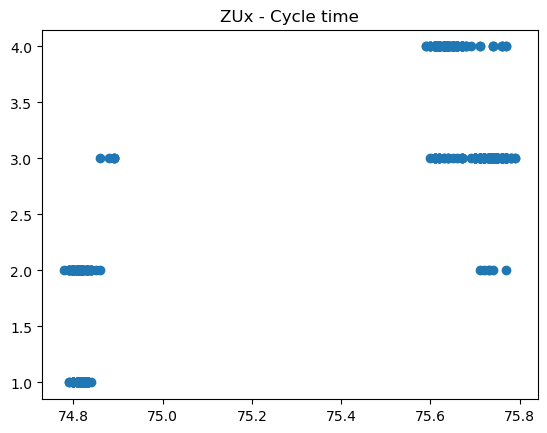

...

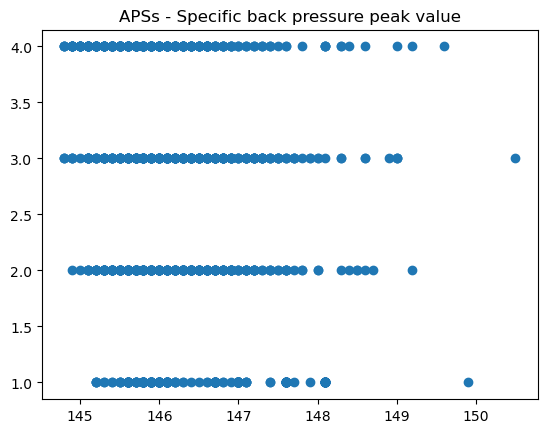

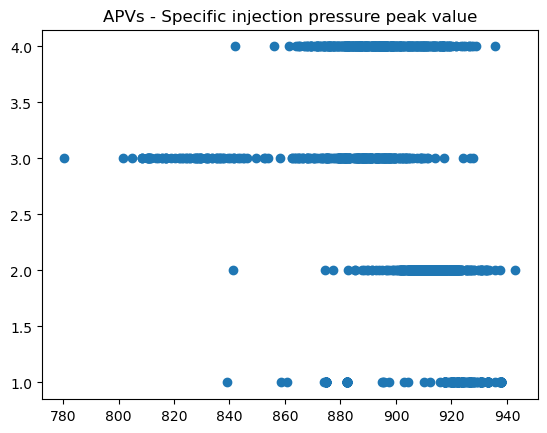

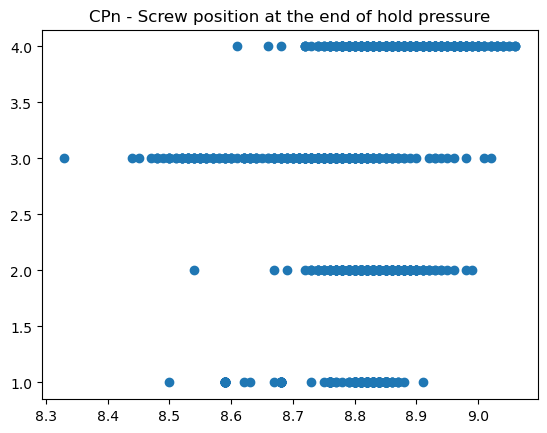

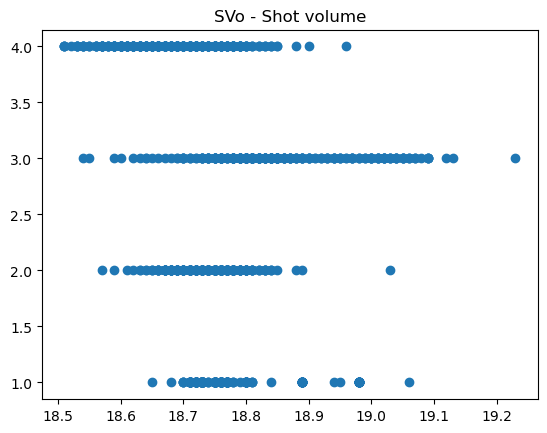

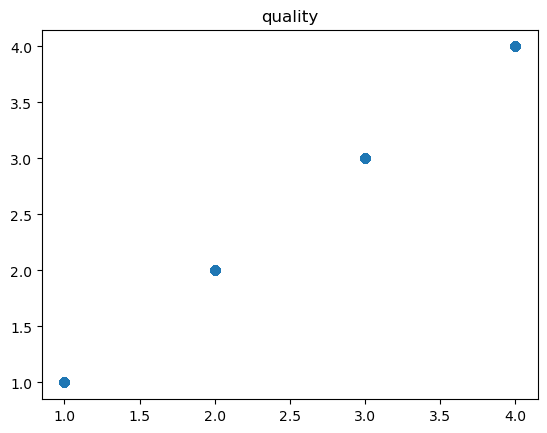

In [10]:
for i in df1.columns.array:
    fig = plt.figure()
    plt.title(i)
    plt.scatter(x = df1[i], y = df1['quality'])
    #fig.savefig("Trajectory:_" + i + '_to_' + 'quality')
    plt.show()

#### We also can use seaborn to build all the trajectories

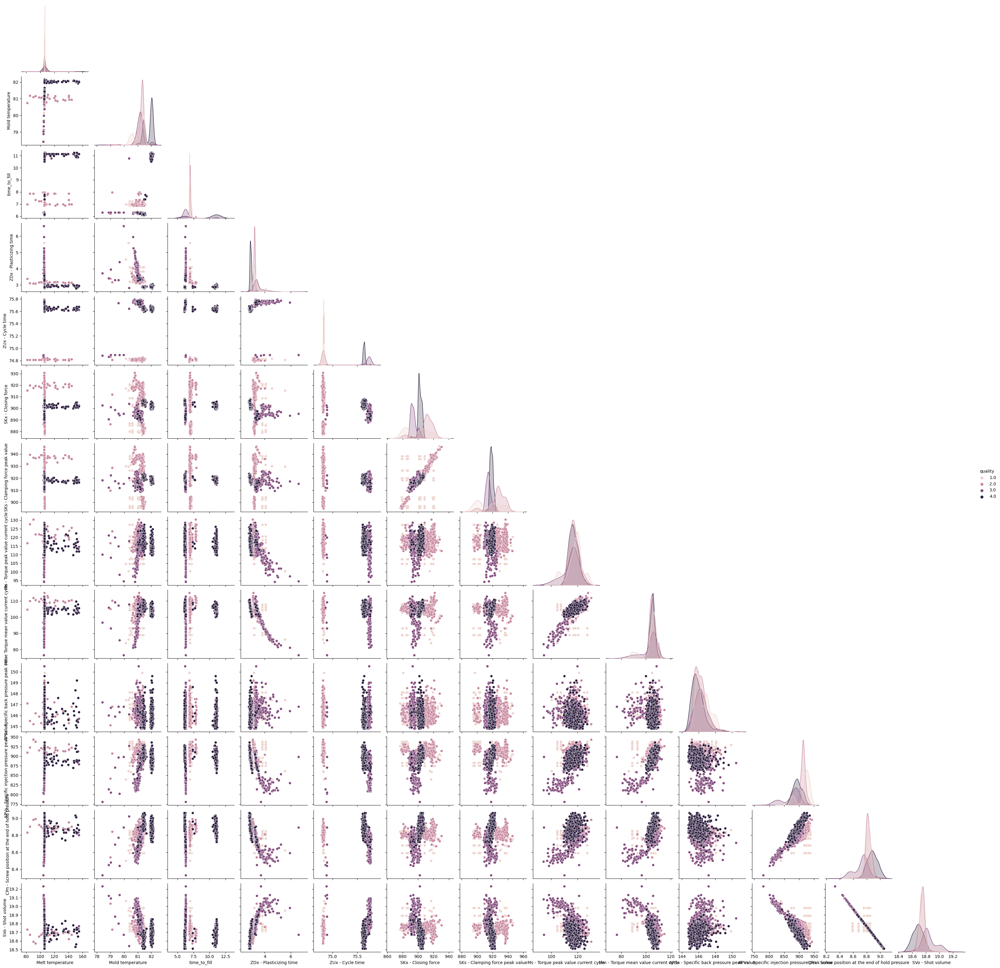

In [11]:
trajs=sns.pairplot(df1,hue=df1.columns[-1],corner=True)

In [12]:
#trajs.figure.savefig("trajectories.png")

# Lets devide data into TRAIN and TEST 

In [19]:
from sklearn.model_selection import train_test_split
training_data, testing_data = train_test_split(df1, test_size=0.2, random_state=25)
X_train = training_data.iloc[:, 0:-1]
y_train = training_data.iloc[:, -1]
X_test = testing_data.iloc[:, 0:-1]
y_test = testing_data.iloc[:, -1]
X = df1.iloc[:, 0:-1]
y = df1.iloc[:, -1]

# Correlations

## Graphics

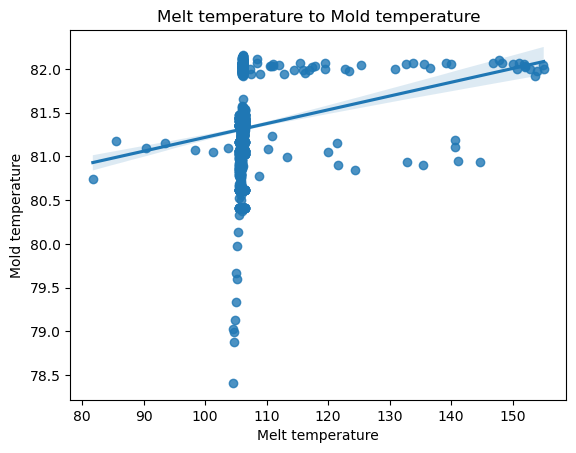

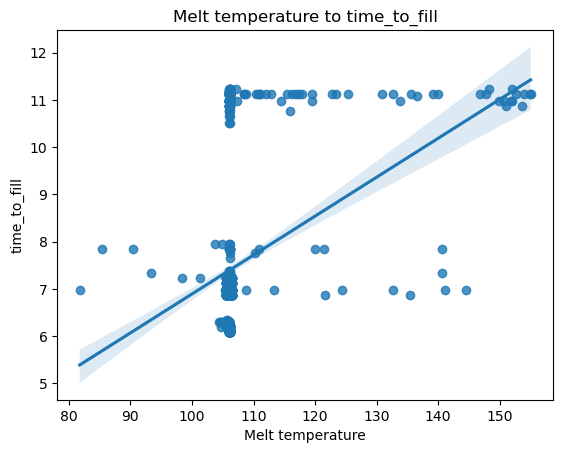

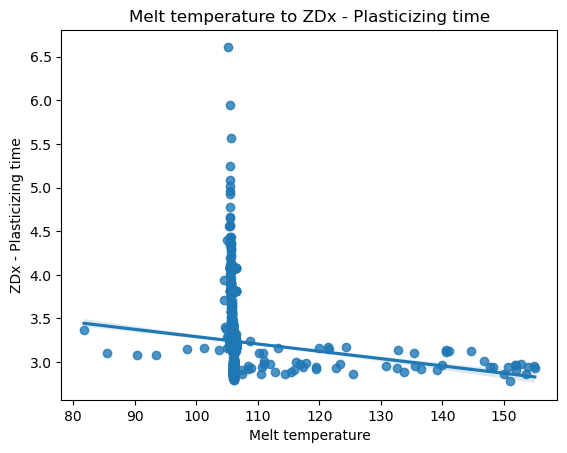

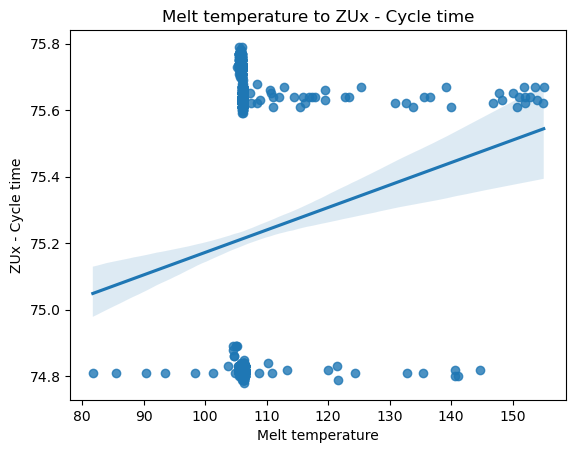

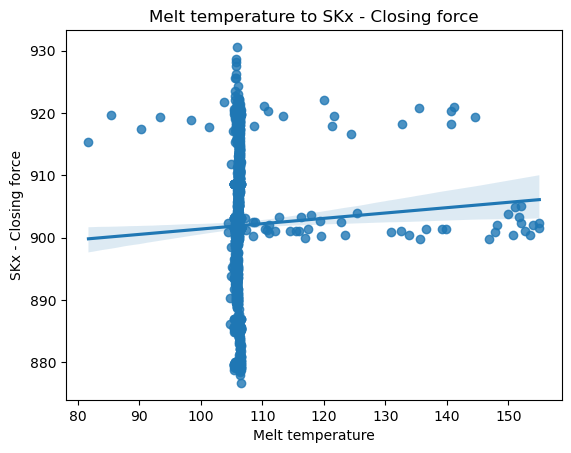

...

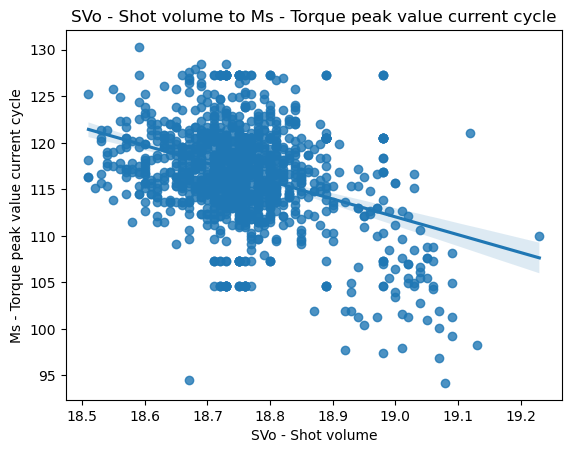

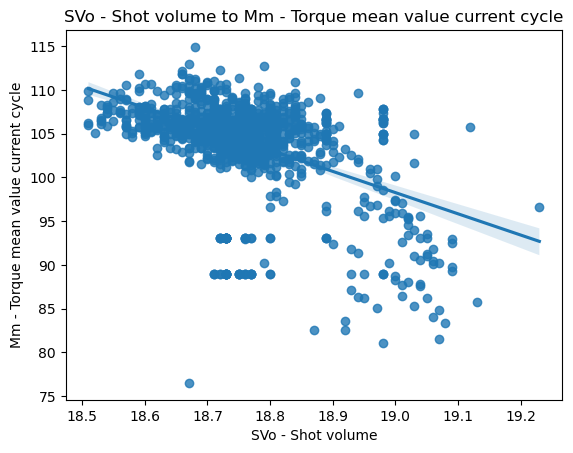

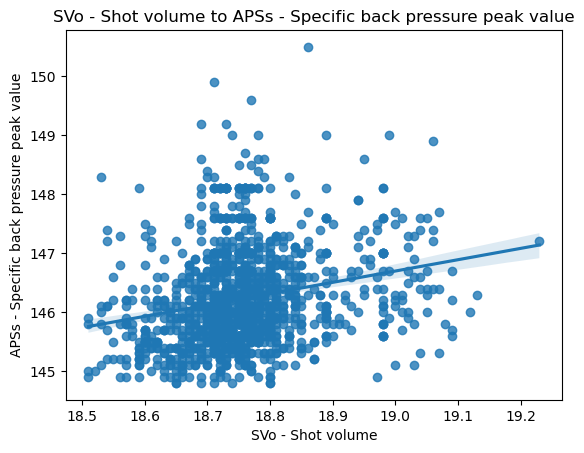

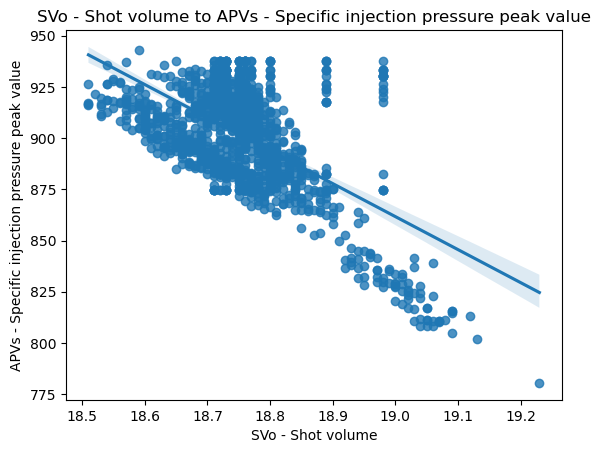

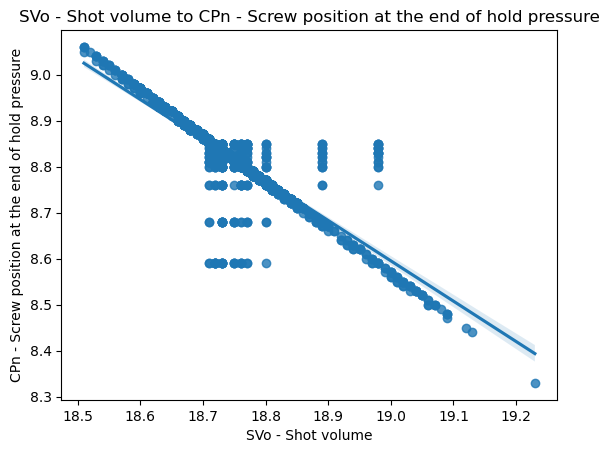

In [14]:
for j in X.columns.array:
    for i in X.columns.array:
        if i != j:
            plt.figure()
            plt.title(j + " to " + i)
            #plt.scatter(x = df1["Melt temperature"], y = df1[i])
            sns.regplot(x = j, y = i, data = X)
            #fig.savefig("correlation_between_"+i+"_"+j)
            plt.show()

## Pearson correlation coefficient

Lets count all the correlations

In [15]:
X_corr = X.corr(method='pearson')
X_corr = X_corr.round(3)

In [16]:
"""coefs = np.empty((0, 3), int)
values = np.empty((0, 3), int)
existsI = np.array([])
for i in df1.columns.array:
    existsI = np.append(existsI, np.array([i]))
    for j in df1.columns.array:
        p_coef, p_value = sp.stats.pearsonr(x = df1[i], y = df1[j])
        # create two structures for coef and value 
        if j not in existsI:
            coefs = np.append(coefs, np.array([[i, j, p_coef]]), axis=0)
            values = np.append(values, np.array([[i,  j, p_value]]), axis=0)
"""

'coefs = np.empty((0, 3), int)\nvalues = np.empty((0, 3), int)\nexistsI = np.array([])\nfor i in df1.columns.array:\n    existsI = np.append(existsI, np.array([i]))\n    for j in df1.columns.array:\n        p_coef, p_value = sp.stats.pearsonr(x = df1[i], y = df1[j])\n        # create two structures for coef and value \n        if j not in existsI:\n            coefs = np.append(coefs, np.array([[i, j, p_coef]]), axis=0)\n            values = np.append(values, np.array([[i,  j, p_value]]), axis=0)\n'

In [17]:
"""
for i in range(len(coefs)):
    if float(coefs[i,2]) >= 0.5 or float(coefs[i,2]) <= -0.5:
        print("{} to {} p_coef: {} , p_value: {}".format(coefs[i,0],coefs[i,1],coefs[i,2],values[i,2]))
"""

'\nfor i in range(len(coefs)):\n    if float(coefs[i,2]) >= 0.5 or float(coefs[i,2]) <= -0.5:\n        print("{} to {} p_coef: {} , p_value: {}".format(coefs[i,0],coefs[i,1],coefs[i,2],values[i,2]))\n'

And count only strong correlations

In [18]:
columnsDict = dict()
for i in range(X.columns.size):
    columnsDict[X.columns[i]]= i

In [19]:
coefs = np.empty((0, 3), int)
values = np.empty((0, 3), int)
for i in X.columns.array:
    for j in X.columns.array:
        p_coef, p_value = sp.stats.pearsonr(x = X[i], y = X[j])
        # if statement for regulate pearson correlation
        if (p_coef <= -0.7 or p_coef >=0.7) and i != j:
            coefs = np.append(coefs, np.array([[i, j, p_coef]]), axis=0)
            values = np.append(values, np.array([[i, j, p_value]]), axis=0)
            
for i in coefs:
    i[0] = columnsDict.get(i[0])
    i[1] = columnsDict.get(i[1])
for i in values:
    i[0] = columnsDict.get(i[0])
    i[1] = columnsDict.get(i[1])

In [20]:
strong_coefs_double_array_numbers = np.zeros((X.columns.size, X.columns.size)) 

for i in range(len(coefs)):
    strong_coefs_double_array_numbers[int(coefs[i,0]), int(coefs[i,1])] = coefs[i,2]
strong_corr_df = pd.DataFrame(data=strong_coefs_double_array_numbers, columns=X.columns)
strong_corr_df = strong_corr_df.round(2)

And moderate correlations:

In [21]:
coefs = np.empty((0, 3), int)
values = np.empty((0, 3), int)
for i in X.columns.array:
    for j in X.columns.array:
        p_coef, p_value = sp.stats.pearsonr(x = X[i], y = X[j])
        # if statement for regulate pearson correlation
        if (p_coef >= 0.3 and p_coef <=0.7) or (p_coef <= -0.3 and p_coef >=-0.7) and i != j:
            coefs = np.append(coefs, np.array([[i, j, p_coef]]), axis=0)
            values = np.append(values, np.array([[i, j, p_value]]), axis=0)
            
for i in coefs:
    i[0] = columnsDict.get(i[0])
    i[1] = columnsDict.get(i[1])
for i in values:
    i[0] = columnsDict.get(i[0])
    i[1] = columnsDict.get(i[1])

In [22]:
moderate_coefs_double_array_numbers = np.zeros((X.columns.size, X.columns.size)) 

for i in range(len(coefs)):
    moderate_coefs_double_array_numbers[int(coefs[i,0]), int(coefs[i,1])] = coefs[i,2]
moderate_corr_df = pd.DataFrame(data=moderate_coefs_double_array_numbers, columns=X.columns)
moderate_corr_df = moderate_corr_df.round(2)

## Lets build heatmaps


### For strong correlations

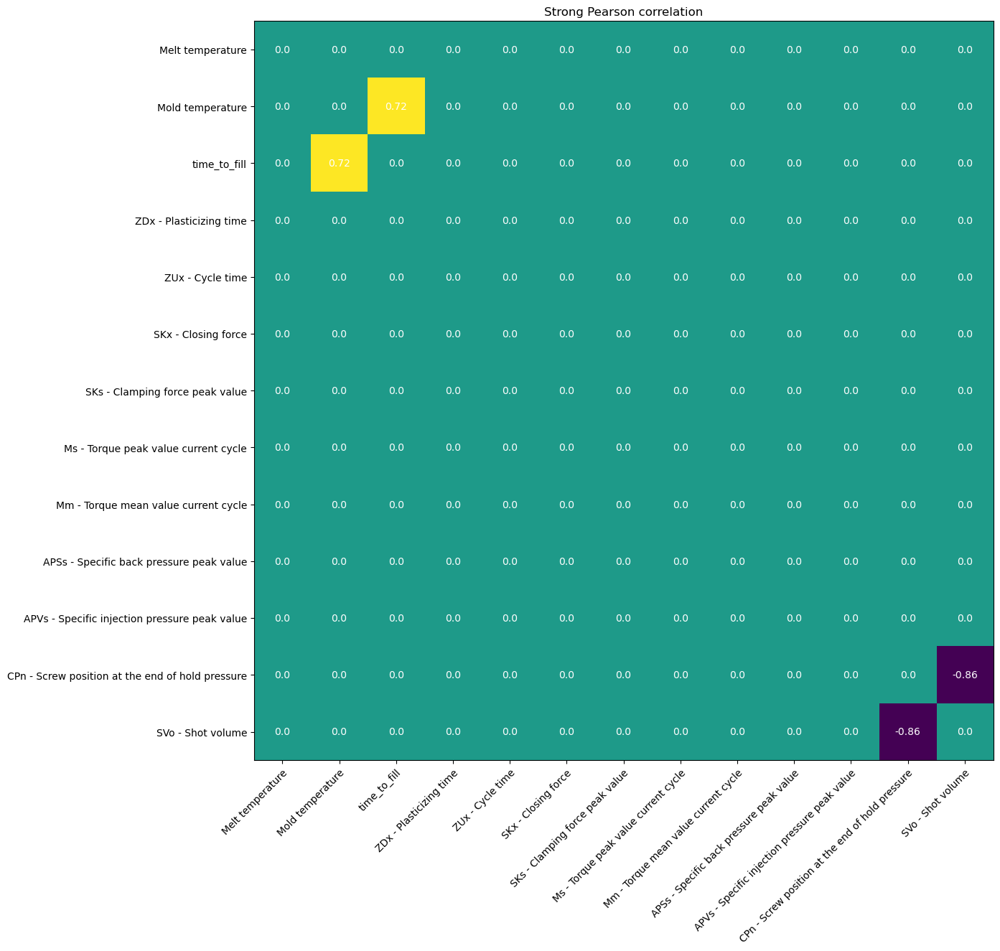

In [23]:
fig, ax = plt.subplots(figsize=(14,14))
im = ax.imshow(strong_corr_df)
# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(strong_corr_df.columns)), labels=strong_corr_df.columns)
ax.set_yticks(np.arange(len(strong_corr_df.columns)), labels=strong_corr_df.columns)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(strong_corr_df.columns)):
    for j in range(len(strong_corr_df.columns)):
        text = ax.text(j, i, strong_corr_df.values[i, j],
                       ha="center", va="center", color="w")

ax.set_title("Strong Pearson correlation")
fig.tight_layout()
#fig.savefig('strong_correlations')
plt.show()

### Moderate correlations

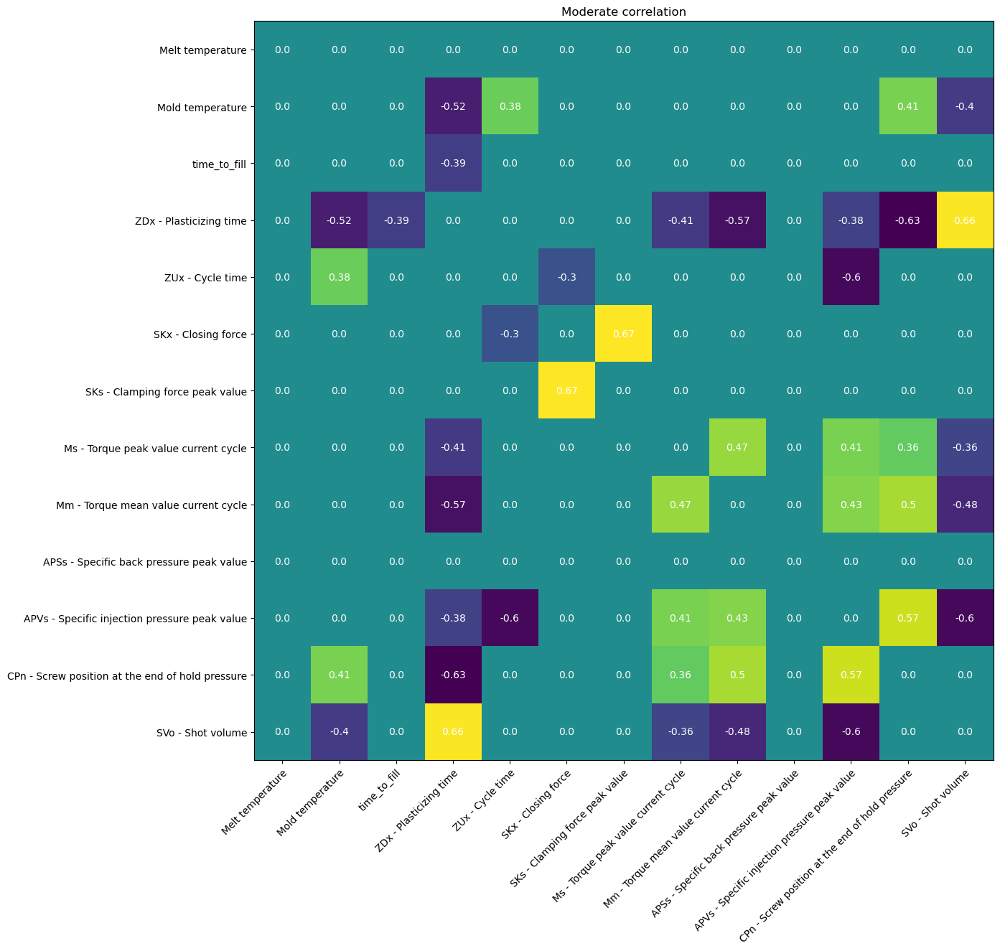

In [24]:
fig, ax = plt.subplots(figsize=(14,14))
im = ax.imshow(moderate_corr_df)
# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(moderate_corr_df.columns)), labels=moderate_corr_df.columns)
ax.set_yticks(np.arange(len(moderate_corr_df.columns)), labels=moderate_corr_df.columns)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(moderate_corr_df.columns)):
    for j in range(len(moderate_corr_df.columns)):
        text = ax.text(j, i, moderate_corr_df.values[i, j],
                       ha="center", va="center", color="w")

ax.set_title("Moderate correlation")
fig.tight_layout()
#fig.savefig('moderate_correlations')
plt.show()

### All corelations

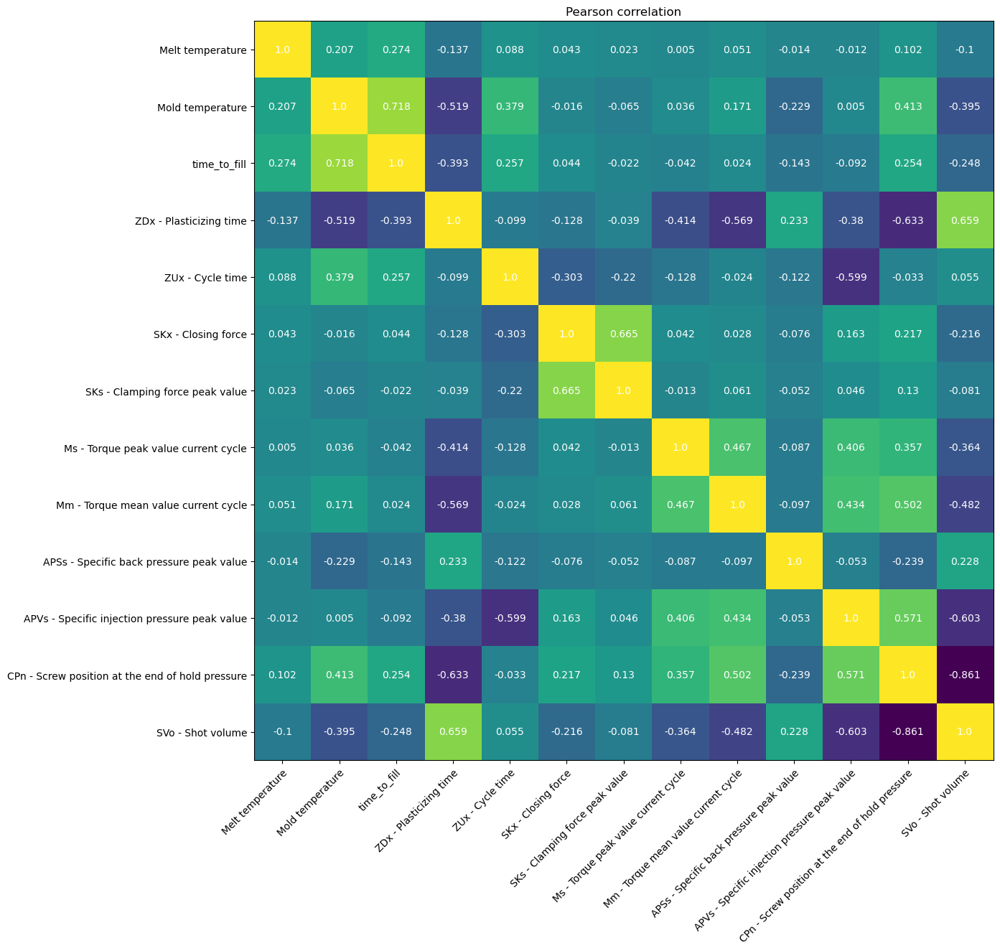

In [25]:
fig, ax = plt.subplots(figsize=(14,14))
im = ax.imshow(X_corr.values)
# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(X_corr.columns)), labels=X_corr.columns)
ax.set_yticks(np.arange(len(X_corr.columns)), labels=X_corr.columns)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(X_corr.columns)):
    for j in range(len(X_corr.columns)):
        text = ax.text(j, i, X_corr.values[i, j],
                       ha="center", va="center", color="w")

ax.set_title("Pearson correlation")
fig.tight_layout()
#fig.savefig(fname='correlations')
plt.show()

In [26]:
#sns.heatmap(X_corr,xticklabels=X_corr.columns, yticklabels=X_corr.columns)

In [27]:
X.columns

Index(['Melt temperature', 'Mold temperature', 'time_to_fill',
       'ZDx - Plasticizing time', 'ZUx - Cycle time', 'SKx - Closing force',
       'SKs - Clamping force peak value',
       'Ms - Torque peak value current cycle',
       'Mm - Torque mean value current cycle',
       'APSs - Specific back pressure peak value',
       'APVs - Specific injection pressure peak value',
       'CPn - Screw position at the end of hold pressure',
       'SVo - Shot volume'],
      dtype='object')

In [28]:
#X = X.drop(['SVo - Shot volume','Mold temperature'],axis=1)
#X_train = X_train.drop(['SVo - Shot volume','Mold temperature'],axis=1)
#X_test = X_test.drop(['SVo - Shot volume','Mold temperature'],axis=1)

In [29]:
DD = X['CPn - Screw position at the end of hold pressure']
DD.values

array([8.82, 8.59, 8.8 , ..., 8.97, 8.93, 9.01])

In [30]:
X.columns

Index(['Melt temperature', 'Mold temperature', 'time_to_fill',
       'ZDx - Plasticizing time', 'ZUx - Cycle time', 'SKx - Closing force',
       'SKs - Clamping force peak value',
       'Ms - Torque peak value current cycle',
       'Mm - Torque mean value current cycle',
       'APSs - Specific back pressure peak value',
       'APVs - Specific injection pressure peak value',
       'CPn - Screw position at the end of hold pressure',
       'SVo - Shot volume'],
      dtype='object')

In [31]:
from sklearn.feature_selection import VarianceThreshold
v_threshold = VarianceThreshold(threshold=(.8 * (1 - .8)))
v_threshold.fit(X)
v_threshold.get_support()

array([ True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True, False, False])

In [32]:
#X = X.drop(['CPn - Screw position at the end of hold pressure','ZDx - Plasticizing time'],axis=1)
#X_train = X_train.drop(['CPn - Screw position at the end of hold pressure','ZDx - Plasticizing time'],axis=1)
#X_test = X_test.drop(['CPn - Screw position at the end of hold pressure','ZDx - Plasticizing time'],axis=1)

In [33]:
X.head()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume
0,106.476184,80.617,7.124,3.16,74.83,886.900000,904.000000,116.9,104.300000,145.6,922.3,8.82,18.73
1,105.505000,81.362,6.968,3.16,74.81,919.409791,935.900000,113.9,104.900000,145.6,930.5,8.59,18.73
2,105.505000,80.411,6.864,4.08,74.81,908.600000,902.344823,120.5,106.503496,147.0,933.1,8.80,18.98
3,106.474827,81.162,6.864,3.16,74.82,879.410871,902.033653,127.3,104.900000,145.6,922.3,8.85,18.73
4,106.466140,81.471,6.864,3.22,74.83,885.644260,902.821269,120.5,106.700000,145.6,917.5,8.80,18.75


## Lets apply scaling, standatrization and normalization for our dataset for different techniques, because

Distance algorithms like <b>KNN, K-means clustering, and SVM(support vector machines)</b> are most affected by the range of features. This is because, behind the scenes, they are using distances between data points to determine their similarity. \ 
Therefore, we scale our data before employing a distance based algorithm so that all the features contribute equally to the result.\

\
Machine learning algorithms like <b>linear regression, logistic regression, neural network, PCA (principal component analysis), etc.</b>, that use gradient descent as an optimization technique require data to be scaled.\
The difference in the ranges of features will cause different step sizes for each feature. To ensure that the gradient descent moves smoothly towards the minima and that the steps for gradient descent are updated at the same rate for all the features, we scale the data before feeding it to the model.\
\
<b>Tree-based algorithms</b>, on the other hand, are fairly insensitive to the scale of the features. Think about it, a decision tree only splits a node based on a single feature. The decision tree splits a node on a feature that increases the homogeneity of the node. Other features do not influence this split on a feature.

So, the remaining features have virtually no effect on the split. This is what makes them invariant to the scale of the features!\
\
<b>Normalization is a scaling technique in which values are shifted and rescaled so that they end up ranging between 0 and 1. It is also known as Min-Max scaling.</b>\
<b>Standardization is another scaling method where the values are centered around the mean with a unit standard deviation. This means that the mean of the attribute becomes zero, and the resultant distribution has a unit standard deviation.</b>\
\
There is the difference between this techniques:\
\
<b>Normalization:</b>  
- Rescales values to a range between 0 and 1
- Useful when the distribution of the data is unknown or not Gaussian
- Sensitive to outliers
- Retains the shape of the original distribution
- May not preserve the relationships between the data points\

<b>Standartization: </b>
- Centers data around the mean and scales to a standard deviation of 1
- Useful when the distribution of the data is Gaussian or unknown
- Less sensitive to outliers
- Changes the shape of the original distribution
- Preserves the relationships between the data points

According to our data its hard to say, which technique is the best, so <b>we will apply both of them and compare result at the end!</b>

In [34]:
df1.describe()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume,quality
count,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000
mean,106.892040,81.326023,7.459043,3.234173,75.218794,901.974834,919.351778,116.716747,104.163904,146.230048,900.972846,8.808863,18.756285,2.461751
std,5.615773,0.428813,1.688106,0.343230,0.432761,11.098192,10.780023,5.029085,4.802195,0.804894,25.519215,0.097238,0.095528,1.123611
min,81.747000,78.409000,6.084000,2.780000,74.780000,876.700000,894.800000,94.200000,76.500000,144.800000,780.500000,8.330000,18.510000,1.000000
25%,105.914500,81.123500,6.292000,3.000000,74.820000,893.600000,914.400000,114.200000,103.550000,145.600000,886.650000,8.770000,18.710000,1.000000
50%,106.089000,81.327000,6.968000,3.192600,74.830000,902.400000,918.800000,116.900000,105.200000,146.100000,906.800000,8.820000,18.750000,2.000000
75%,106.263000,81.441000,7.124000,3.290000,75.650000,909.400000,926.300000,120.200000,106.531415,146.700000,918.900000,8.850000,18.790000,4.000000
max,155.032000,82.159000,11.232000,6.610000,75.790000,930.600000,946.500000,130.300000,114.900000,150.500000,943.000000,9.060000,19.230000,4.000000


refereing back to pd.describe() we can see that there is huge difference between all features. \
Let’s try and fix that using feature scaling!

As start we will devide data to X and y

### Normalization Using sklearn

In [20]:
from sklearn.preprocessing import MinMaxScaler
norm = MinMaxScaler().fit(X_train)
# transform training data
X_train_norm = norm.transform(X_train)
# transform testing data
X_test_norm = norm.transform(X_test)

In [21]:
X_train_norm_df = pd.DataFrame(X_train_norm, columns=list(X_train.columns[:]))
X_test_norm = pd.DataFrame(X_test_norm, columns=list(X_test.columns[:]))

In [37]:
X_train_norm_df.head()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume
0,0.332264,0.953600,0.979798,0.036649,0.83,0.458256,0.468085,0.678670,0.718750,0.254902,0.651692,0.753425,0.236111
1,0.334543,0.777067,0.171717,0.117801,0.02,0.667904,0.624758,0.795014,0.716146,0.235294,0.875077,0.630137,0.375000
2,0.335157,0.796800,0.171717,0.130890,0.02,0.567718,0.588008,0.570637,0.700521,0.352941,0.787692,0.657534,0.347222
3,0.333970,0.786933,0.171717,0.125654,0.03,0.684601,0.663443,0.520776,0.692708,0.156863,0.783385,0.698630,0.305556
4,0.329699,0.758400,0.040404,0.130890,0.94,0.243043,0.388781,0.562327,0.755208,0.254902,0.726154,0.616438,0.375000


### Standardization Using sklearn

In [22]:
from sklearn.preprocessing import StandardScaler

# copy of datasets
X_train_stand = X_train.copy()
X_test_stand = X_test.copy()

# numerical features
num_cols = list(X_train.columns[:])

# apply standardization on numerical features
for i in num_cols:
    
    # fit on training data column
    scale = StandardScaler().fit(X_train_stand[[i]])
    
    # transform the training data column
    X_train_stand[i] = scale.transform(X_train_stand[[i]])
    
    # transform the testing data column
    X_test_stand[i] = scale.transform(X_test_stand[[i]])

In [39]:
X_train_stand.head()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume
1320,-0.146125,1.553125,2.190307,-0.907218,0.917477,-0.036210,-0.034587,0.399312,-0.009517,-0.135781,-0.542520,0.726294,-0.784103
552,-0.117783,-0.012901,-0.283773,0.020429,-0.954128,0.976905,0.714522,1.233158,-0.030458,-0.262191,0.862160,-0.188033,0.246326
479,-0.110146,0.162154,-0.283773,0.170049,-0.954128,0.492761,0.538805,-0.374974,-0.156107,0.496266,0.312670,0.015151,0.040240
692,-0.124911,0.074626,-0.283773,0.110201,-0.931022,1.057595,0.899487,-0.732337,-0.218931,-0.767829,0.285583,0.319927,-0.268889
1000,-0.178031,-0.178493,-0.685811,0.170049,1.171646,-1.076220,-0.413766,-0.434535,0.283663,-0.135781,-0.074294,-0.289624,0.246326


## Lets compare Unscaled, Normalized and Standartized data

[Text(0.5, 1.0, 'UnScaled data')]

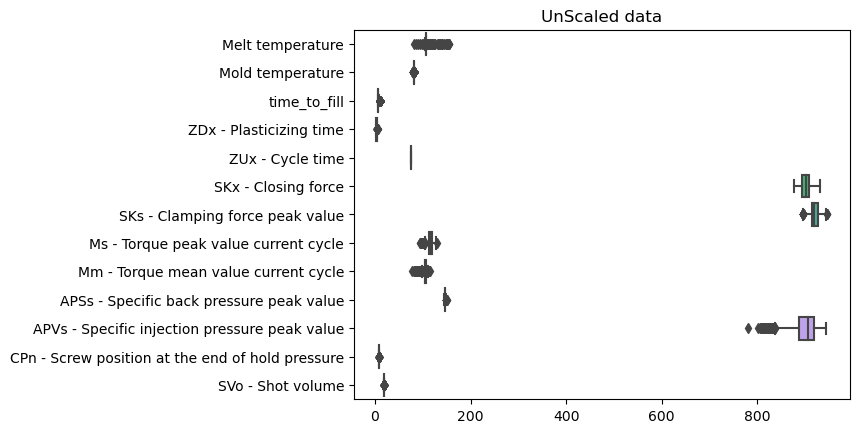

In [40]:
sns.boxplot(data=X_train,orient='h').set(title='UnScaled data')

[Text(0.5, 1.0, 'Normalized data')]

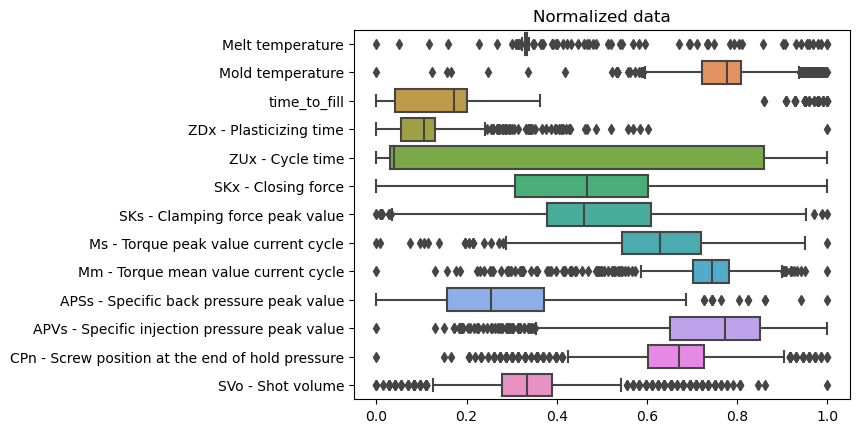

In [41]:
sns.boxplot(data=X_train_norm_df,orient='h').set(title='Normalized data')

[Text(0.5, 1.0, 'Standardized data')]

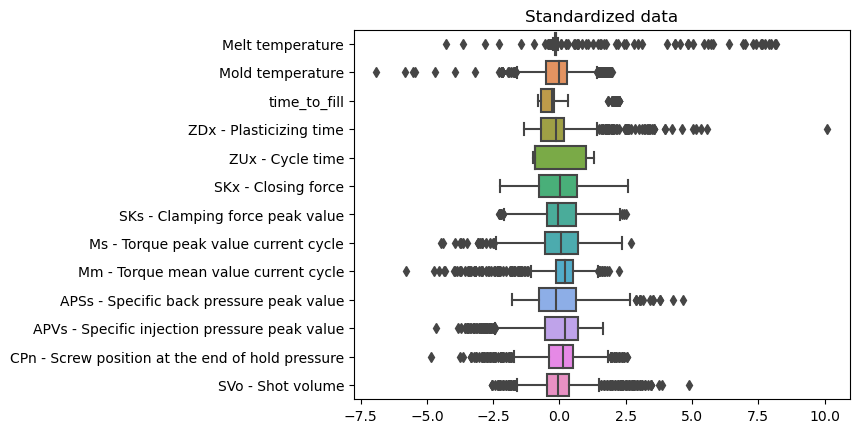

In [42]:
sns.boxplot(data=X_train_stand,orient='h').set(title='Standardized data')

Lets check correlation for normalized data

# Is regression models applicable?

## Linear regression

In [43]:
from sklearn import linear_model

In [44]:
linear_reg_stand = linear_model.LinearRegression()
linear_reg_stand.fit(X_train_stand,y_train)
linear_reg_norm = linear_model.LinearRegression()
linear_reg_norm.fit(X_train_norm,y_train)

LinearRegression()

In [45]:
linear_reg_stand_pred = np.around(linear_reg_stand.predict(X_test_stand)).astype(str)
linear_reg_norm_pred = np.around(linear_reg_norm.predict(X_test_norm)).astype(str)

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  warnings.warn(


In [46]:
from sklearn.metrics import confusion_matrix

In [47]:
linear_reg_stand_pred_cm = confusion_matrix(y_test.array.astype(str), linear_reg_stand_pred)
linear_reg_norm_pred_cm = confusion_matrix(y_test.array.astype(str), linear_reg_norm_pred)

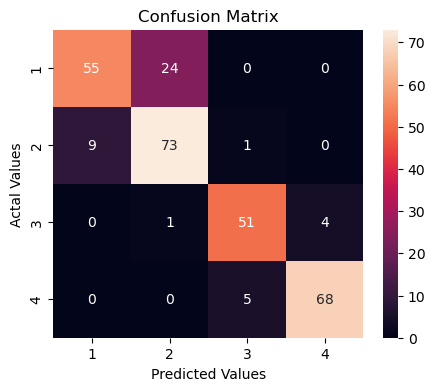

In [48]:
cm_df = pd.DataFrame(linear_reg_stand_pred_cm,
                     index = ['1','2','3','4'], 
                     columns = ['1','2','3','4'])
plt.figure(figsize=(5,4))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

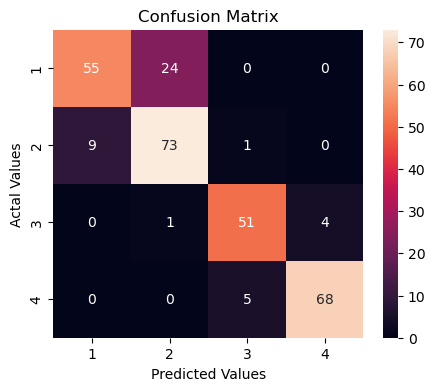

In [49]:
cm_df = pd.DataFrame(linear_reg_norm_pred_cm,
                     index = ['1','2','3','4'], 
                     columns = ['1','2','3','4'])
plt.figure(figsize=(5,4))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

In [50]:
from sklearn.metrics import classification_report
print(classification_report(y_test.array.astype(str), linear_reg_stand_pred))

              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291



In [51]:
print(classification_report(y_test.array.astype(str), linear_reg_norm_pred))

              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291



## Polynomial Regression

In [52]:
from sklearn.preprocessing import PolynomialFeatures
for i in range(1,4):
    print(i)
    poly = PolynomialFeatures(degree=i, include_bias=False)
    # Standardized
    poly_features_stand = poly.fit_transform(np.array(X_train_stand))
    poly_reg_model_stand = linear_model.LinearRegression()
    poly_reg_model_stand.fit(poly_features_stand, y_train)
    poly_features_stand_test = poly.fit_transform(np.array(X_test_stand))
    poly_features_stand_pred = np.around(poly_reg_model_stand.predict(poly_features_stand_test)).astype(str)
    print(classification_report(y_test.array.astype(str), poly_features_stand_pred))
    # Normalized
    poly_features_norm = poly.fit_transform(np.array(X_train_norm))
    poly_reg_model_norm = linear_model.LinearRegression()
    poly_reg_model_norm.fit(poly_features_norm, y_train)
    poly_features_norm_test = poly.fit_transform(np.array(X_test_norm))
    poly_features_norm_pred = np.around(poly_reg_model_norm.predict(poly_features_norm_test)).astype(str)
    print(classification_report(y_test.array.astype(str), poly_features_norm_pred))
    print("-----")

    

1
              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291

              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291

-----
2
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

## Ridge Regression

In [53]:
ridge_model = linear_model.Ridge(alpha=1.0)
ridge_model.fit(X_train_stand, y_train)
ridge_model_pred = ridge_model.predict(X_test_stand)
ridge_model_pred = np.around(ridge_model_pred)

In [54]:
print(classification_report(y_test.array.astype(str), ridge_model_pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291



In [55]:
ridge_model = linear_model.Ridge(alpha=1.0)
ridge_model.fit(X_train_norm_df, y_train)
ridge_model_pred = ridge_model.predict(X_test_norm)
ridge_model_pred = np.around(ridge_model_pred)
print(classification_report(y_test.array.astype(str), ridge_model_pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.87      0.70      0.77        79
         2.0       0.75      0.89      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.86      0.86       291
weighted avg       0.86      0.85      0.85       291



## Lasso regression

In [56]:
lasso_model = linear_model.Lasso(alpha=0.001)
lasso_model.fit(X_train_stand, y_train)
lasso_model_pred = lasso_model.predict(X_test_stand)
lasso_model_pred = np.around(lasso_model_pred)
print(classification_report(y_test.array.astype(str), lasso_model_pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291



In [57]:
lasso_model = linear_model.Lasso(alpha=0.0001)
lasso_model.fit(X_train_norm, y_train)
lasso_model_pred = lasso_model.predict(X_test_norm)
lasso_model_pred = np.around(lasso_model_pred)
print(classification_report(y_test.array.astype(str), lasso_model_pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291



/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but Lasso was fitted without feature names
  warnings.warn(


## Regression trees

In [58]:
# i will use GridSearch to find best params for model

In [11]:
from sklearn import decomposition
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
pca = decomposition.PCA()
dec_tree = tree.DecisionTreeRegressor()
pipe = Pipeline(steps=[('dec_tree', dec_tree)])
criterion = ['poisson', 'absolute_error','friedman_mse','squared_error']
max_depth = [2,4,6,8,10,12]
parameters = dict(dec_tree__criterion=criterion, dec_tree__max_depth=max_depth)
clf_GS = GridSearchCV(pipe, parameters)
for i in [X_train_stand, X_train_norm]:
    clf_GS.fit(i, y_train)
    print('Best Criterion:', clf_GS.best_estimator_.get_params()['dec_tree__criterion'])
    print('Best max_depth:', clf_GS.best_estimator_.get_params()['dec_tree__max_depth'])
    print(); 
    print(clf_GS.best_estimator_.get_params()['dec_tree'])

NameError: name 'X_train_stand' is not defined

In [60]:
from sklearn.tree import DecisionTreeRegressor
reg_tree = DecisionTreeRegressor(criterion='poisson', max_depth=6)
reg_tree.fit(X_train_stand, y_train)
y_stand_pred = np.around(reg_tree.predict(X_test_stand))
print(classification_report(y_test.array.astype(str),y_stand_pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.96      0.89      0.92        79
         2.0       0.89      0.95      0.92        83
         3.0       0.94      0.91      0.93        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.93      0.93      0.93       291



In [61]:
reg_tree_norm = DecisionTreeRegressor(criterion='poisson', max_depth=6)
reg_tree_norm.fit(X_train_norm, y_train)
y_norm_pred = np.around(reg_tree_norm.predict(X_test_norm))
print(classification_report(y_test.array.astype(str),y_norm_pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.96      0.89      0.92        79
         2.0       0.90      0.95      0.92        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.93      0.93      0.93       291



/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(


## Random Forest

In [8]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
random_grid

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000],
 'max_features': ['auto', 'sqrt'],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'min_samples_split': [2, 5, 10],
 'min_samples_leaf': [1, 2, 4],
 'bootstrap': [True, False]}

In [63]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train_stand, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [64]:
rf_random.best_params_

{'n_estimators': 600,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 110,
 'bootstrap': False}

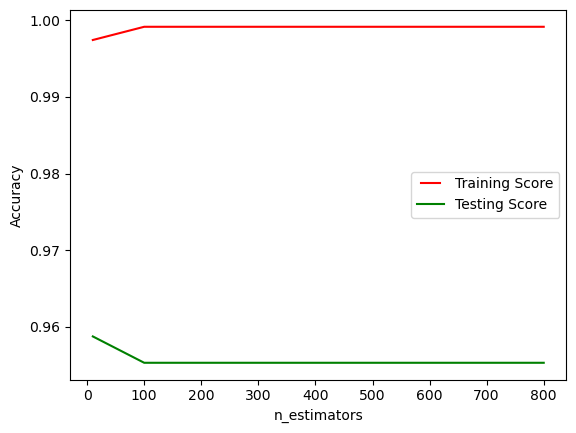

In [120]:
from sklearn.metrics import accuracy_score
train_results = []
test_results = []
for nb_trees in n_estimators:
    rf = RandomForestRegressor(n_estimators=nb_trees, min_samples_split=2, min_samples_leaf=2, max_features= 'sqrt',max_depth=110, bootstrap=False, random_state=42)
    rf.fit(X_train_stand, y_train)
    pr_tr = np.around(rf.predict(X_train_stand))
    pr_te = np.around(rf.predict(X_test_stand))
    train_results.append(accuracy_score(y_train, pr_tr))
    test_results.append(accuracy_score(y_test, pr_te))
line1, = plt.plot(n_estimators, train_results, color="r", label="Training Score")
line2, = plt.plot(n_estimators, test_results, color="g", label="Testing Score")
from matplotlib.legend_handler import HandlerLine2D
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('Accuracy')
plt.xlabel('n_estimators')
plt.show()

In [129]:
rand_forest = RandomForestRegressor(n_estimators=600, min_samples_split=2, min_samples_leaf= 2, max_features= 'sqrt',max_depth=110, bootstrap=False, random_state=42)
rand_forest.fit(X_train_stand, y_train)
pred = np.around(rand_forest.predict(X_test_stand))
print(classification_report(y_test.array.astype(str),pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291



In [67]:
rf_random.fit(X_train_norm, y_train)
rf_random.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past be

{'n_estimators': 600,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 60,
 'bootstrap': False}

In [68]:
#Feature importance based on mean decrease in impurity

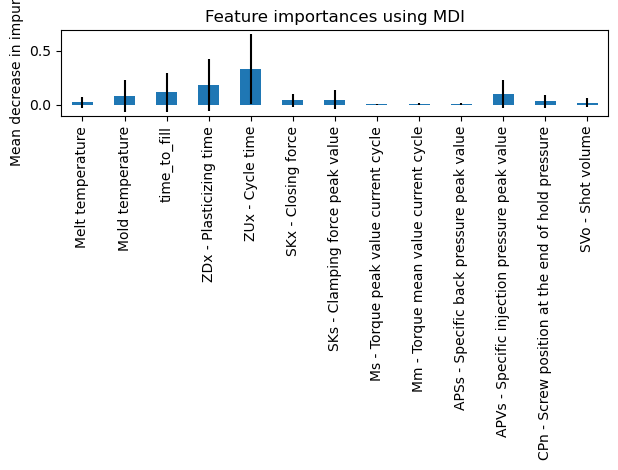

In [69]:
importances = rand_forest.feature_importances_
forest_importances = pd.Series(importances, index=X_train_stand.columns.array)
std = np.std([tree.feature_importances_ for tree in rand_forest.estimators_], axis=0)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [70]:
#feature importance based on feature permutation

[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   6.3s
[CV] END bootstrap=False, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   7.5s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.9s
[CV] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   3.1s
[CV] END bootstrap=True, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   3.4s
[CV] END bootstrap=False, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1600; total time=   5.3s
[CV] END bootstrap=False, max_depth=80, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   4.4s
[CV] END bootstrap=False, max_depth=10

[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END bootstrap=False, max_depth=80, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=400; total time=   1.2s
[CV] END bootstrap=False, max_depth=110, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.8s
[CV] END bootstrap=False, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  13.9s
[CV] END bootstrap=True, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   4.3s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   1.3s
[CV] END bootstrap=False, max_depth=80

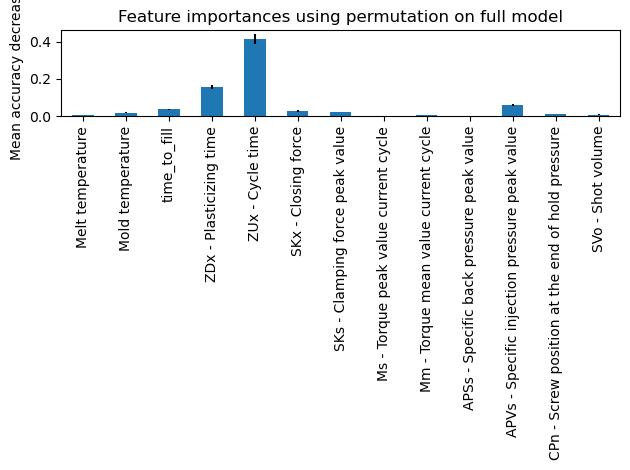

In [71]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    rand_forest, X_test_stand, y_test, n_repeats=10, random_state=42, n_jobs=2
)
forest_importances = pd.Series(result.importances_mean, index=X_train_stand.columns.array)
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [131]:
rand_forest = RandomForestRegressor(n_estimators=600, min_samples_split=5, min_samples_leaf= 1, max_features= 'sqrt',max_depth=60, bootstrap=True, random_state=42)
rand_forest.fit(X_train_norm, y_train)
pred = np.around(rand_forest.predict(X_test_norm))
print(classification_report(y_test.array.astype(str),pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291



/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


## Gradient Boosting

In [73]:
from sklearn.ensemble import GradientBoostingRegressor
reg = GradientBoostingRegressor()

In [74]:
parameters = {
    "n_estimators":[5,50,250,500],
    "max_depth":[1,3,5,7,9],
    "learning_rate":[0.01,0.1,1,10,100]
}


In [75]:
cv = GridSearchCV(reg,parameters)
cv.fit(X_train_stand,y_train)


/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/en

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_l

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_l

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: Runt

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_l

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/en

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py:927: RuntimeWarning: overflow encountered in square
  numerator = (weight * (y_true - y_pred) ** 2).sum(axis=0, dtype=np.float64)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/en

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_l

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_l

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_l

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/en

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/en

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:288: RuntimeWarning: invalid value encountered in add
  raw_predictions[:, k] += learning_rate * tree.predict(X).ravel()
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_the

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:288: RuntimeWarning: invalid value encountered in add
  raw_predictions[:, k] += learning_rate * tree.predict(X).ravel()
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_the

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:288: RuntimeWarning: invalid value encountered in add
  raw_predictions[:, k] += learning_rate * tree.predict(X).ravel()
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavch

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_l

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/en

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/ensemble/_gb_losses.py:231: RuntimeWarning: overflow encountered in square
  * np.sum(sample_weight * ((y - raw_predictions.ravel()) ** 2))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-package

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py", line 723, in score
    return r2_score(y, y_pred, sample_weight=sample_weight)
  File "/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_regression.py", line 911, in r2_

GridSearchCV(estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.01, 0.1, 1, 10, 100],
                         'max_depth': [1, 3, 5, 7, 9],
                         'n_estimators': [5, 50, 250, 500]})

In [76]:
cv.best_params_

{'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}

In [139]:
reg = GradientBoostingRegressor(learning_rate=0.1, max_depth=3, n_estimators=50)
reg.fit(X_train_stand, y_train)
pred = np.around(reg.predict(X_test_stand))
print(classification_report(y_test.array.astype(str),pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.97      0.95      0.96        79
         2.0       0.95      0.96      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291



In [145]:
reg = GradientBoostingRegressor(learning_rate=0.1, max_depth=3, n_estimators=50)
reg.fit(X_train_norm, y_train)
pred = np.around(reg.predict(X_test_norm))
print(classification_report(y_test.array.astype(str),pred.astype(str)))

              precision    recall  f1-score   support

         1.0       0.97      0.95      0.96        79
         2.0       0.95      0.96      0.96        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291



/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  warnings.warn(


### SVM

In [79]:
from sklearn import svm

In [80]:
param_grid = {'C': [1, 10, 12, 14, 16, 18, 20, 22],
            'gamma': [0.001, 0.01, 0.1, 1, 2, 5],
            'epsilon': [0.001, 0.01, 0.1, 1, 2, 4]}
grid_search = GridSearchCV(svm.SVR(), param_grid = param_grid, 
                         cv = 2, n_jobs = -1, verbose = 2, scoring="neg_mean_squared_error")
grid_search.fit(X_train_stand, y_train)
print(grid_search.best_params_)

Fitting 2 folds for each of 288 candidates, totalling 576 fits
{'C': 10, 'epsilon': 0.01, 'gamma': 0.1}


In [81]:
print(grid_search.best_params_)

{'C': 10, 'epsilon': 0.01, 'gamma': 0.1}


In [146]:
svregg = svm.SVR(C=10, epsilon=0.01, gamma=0.1)
svregg.fit(X_train_stand, y_train)

SVR(C=10, epsilon=0.01, gamma=0.1)

In [147]:
pred_svr = np.around(svregg.predict(X_test_stand))


In [148]:
print(classification_report(y_test,pred_svr))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       0.94      0.80      0.86        79
         2.0       0.84      0.93      0.88        83
         3.0       0.91      0.89      0.90        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.89       291
   macro avg       0.73      0.71      0.72       291
weighted avg       0.91      0.89      0.90       291



/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

In [85]:
param_grid = {'C': [1, 10, 12, 14, 16, 18, 20, 22],
            'gamma': [0.001, 0.01, 0.1, 1, 2, 5],
            'epsilon': [0.001, 0.01, 0.1, 1, 2, 4]}
grid_search = GridSearchCV(svm.SVR(), param_grid = param_grid, 
                         cv = 2, n_jobs = -1, verbose = 2, scoring="neg_mean_squared_error")
grid_search.fit(X_train_norm, y_train)
print(grid_search.best_params_)

Fitting 2 folds for each of 288 candidates, totalling 576 fits
{'C': 12, 'epsilon': 0.01, 'gamma': 2}


In [149]:
svregg = svm.SVR(C=12, epsilon=0.01, gamma=2)
svregg.fit(X_train_norm, y_train)

SVR(C=12, epsilon=0.01, gamma=2)

In [150]:
pred_svr = np.around(svregg.predict(X_test_norm))

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(


In [151]:
print(classification_report(y_test,pred_svr))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       0.92      0.82      0.87        79
         2.0       0.87      0.92      0.89        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.74      0.73      0.73       291
weighted avg       0.92      0.91      0.91       291



/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

# Classification models

## Logister regression one-vs-all

In [89]:
from sklearn.linear_model import LogisticRegression

In [90]:
param_grid = {'solver' : ['newton-cg', 'lbfgs', 'liblinear'],
              'penalty' : ['l2'],
              'C' : [100, 10, 1.0, 0.1, 0.01]}
clf = GridSearchCV(LogisticRegression(multi_class='ovr'), param_grid = param_grid, cv = 5, verbose=True, n_jobs=-1)
clf.fit(X_train_stand, y_train)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://s

GridSearchCV(cv=5, estimator=LogisticRegression(multi_class='ovr'), n_jobs=-1,
             param_grid={'C': [100, 10, 1.0, 0.1, 0.01], 'penalty': ['l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             verbose=True)

In [91]:
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
params = clf.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

0.849138 (0.028721) with: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.849138 (0.028721) with: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.849138 (0.028721) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.849138 (0.028721) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.849138 (0.028721) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.850000 (0.028773) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.850000 (0.028773) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
0.850000 (0.028773) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}
0.850000 (0.027854) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.855172 (0.026515) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.855172 (0.026515) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.854310 (0.026487) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
0.852586 (0.028514) with: {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}
0.852586 (0.02851

In [152]:
Multiclass_model = LogisticRegression(multi_class='ovr', C=0.1,penalty='l2',solver='newton-cg')
Multiclass_model.fit(X_train_stand, y_train)

LogisticRegression(C=0.1, multi_class='ovr', solver='newton-cg')

In [153]:
y_pred = Multiclass_model.predict(X_test_stand)

In [154]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         1.0       0.85      0.71      0.77        79
         2.0       0.76      0.87      0.81        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.86       291
   macro avg       0.87      0.87      0.87       291
weighted avg       0.87      0.86      0.86       291



In [155]:
clf.fit(X_train_norm, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


GridSearchCV(cv=5, estimator=RidgeClassifier(), n_jobs=-1,
             param_grid={'alpha': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,
                                   1.0]},
             scoring='accuracy', verbose=True)

In [96]:
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
params = clf.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

0.850000 (0.028773) with: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.850000 (0.028773) with: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.850000 (0.028773) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.850000 (0.027586) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.850000 (0.027586) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.850000 (0.027586) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.850000 (0.026766) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
0.850000 (0.026766) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}
0.845690 (0.026766) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.835345 (0.024746) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.835345 (0.024746) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.830172 (0.024926) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
0.794828 (0.022579) with: {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}
0.794828 (0.02257

In [156]:
Multiclass_model = LogisticRegression(multi_class='ovr', C=1,penalty='l2',solver='newton-cg')
Multiclass_model.fit(X_train_norm, y_train)

LogisticRegression(C=1, multi_class='ovr', solver='newton-cg')

In [157]:
y_pred = Multiclass_model.predict(X_test_norm)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         1.0       0.86      0.71      0.78        79
         2.0       0.76      0.88      0.82        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.87       291
   macro avg       0.88      0.87      0.87       291
weighted avg       0.87      0.87      0.86       291



/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


In [158]:
Multiclass_model.score(X_test_norm,y_test)

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


0.865979381443299

## Ridge Classifier

In [100]:
from sklearn.linear_model import RidgeClassifier

In [101]:
param_grid = {'alpha' : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}
clf = GridSearchCV(RidgeClassifier(), param_grid = param_grid, cv = 5, verbose=True, n_jobs=-1,scoring='accuracy')
clf.fit(X_train_stand, y_train)
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
params = clf.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
0.847414 (0.026091) with: {'alpha': 0.1}
0.847414 (0.026091) with: {'alpha': 0.2}
0.847414 (0.026091) with: {'alpha': 0.3}
0.847414 (0.026091) with: {'alpha': 0.4}
0.847414 (0.026091) with: {'alpha': 0.5}
0.847414 (0.026091) with: {'alpha': 0.6}
0.847414 (0.026091) with: {'alpha': 0.7}
0.847414 (0.026091) with: {'alpha': 0.8}
0.847414 (0.026091) with: {'alpha': 0.9}
0.847414 (0.026091) with: {'alpha': 1.0}


In [159]:
ridge_classifier = RidgeClassifier(alpha=0.1).fit(X_train_stand,y_train)
ridge_classifier.score(X_test_stand,y_test)

0.8419243986254296

In [103]:
param_grid = {'alpha' : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}
clf = GridSearchCV(RidgeClassifier(), param_grid = param_grid, cv = 5, verbose=True, n_jobs=-1,scoring='accuracy')
clf.fit(X_train_norm, y_train)
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
params = clf.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
0.847414 (0.026091) with: {'alpha': 0.1}
0.847414 (0.026091) with: {'alpha': 0.2}
0.848276 (0.025486) with: {'alpha': 0.3}
0.847414 (0.025074) with: {'alpha': 0.4}
0.847414 (0.025074) with: {'alpha': 0.5}
0.846552 (0.024474) with: {'alpha': 0.6}
0.847414 (0.025369) with: {'alpha': 0.7}
0.848276 (0.025776) with: {'alpha': 0.8}
0.848276 (0.025776) with: {'alpha': 0.9}
0.848276 (0.025776) with: {'alpha': 1.0}


In [160]:
ridge_classifier = RidgeClassifier(alpha=1.0).fit(X_train_norm,y_train)
ridge_classifier.score(X_test_norm,y_test)

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but RidgeClassifier was fitted without feature names
  warnings.warn(


0.852233676975945

## KNN

In [9]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RepeatedStratifiedKFold

In [106]:
model = KNeighborsClassifier()
n_neighbors = range(1, 21, 2)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
grid = dict(n_neighbors=n_neighbors,weights=weights,metric=metric)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train_stand, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))


Best: 0.916954 using {'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'uniform'}
0.867241 (0.029496) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
0.867241 (0.029496) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'distance'}
0.898563 (0.022774) with: {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'uniform'}
0.897701 (0.023423) with: {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'distance'}
0.890805 (0.022184) with: {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'uniform'}
0.890517 (0.022052) with: {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}
0.886782 (0.025740) with: {'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'uniform'}
0.887931 (0.025084) with: {'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'distance'}
0.875862 (0.024138) with: {'metric': 'euclidean', 'n_neighbors': 9, 'weights': 'uniform'}
0.878161 (0.023210) with: {'metric': 'euclidean', 'n_neighbors': 9, 'weights': 'distance'}
0.870690 (

In [161]:
model = KNeighborsClassifier(metric='manhattan',n_neighbors=7,weights='uniform').fit(X_train_stand, y_train)

In [162]:
model.score(X_test_stand, y_test)

0.9003436426116839

In [109]:
model = KNeighborsClassifier()
n_neighbors = range(1, 21, 2)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
grid = dict(n_neighbors=n_neighbors,weights=weights,metric=metric)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train_norm, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))


Best: 0.916954 using {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'uniform'}
0.864368 (0.028149) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
0.864368 (0.028149) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'distance'}
0.897126 (0.023125) with: {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'uniform'}
0.895977 (0.023966) with: {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'distance'}
0.884483 (0.020951) with: {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'uniform'}
0.887069 (0.019952) with: {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}
0.877299 (0.024553) with: {'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'uniform'}
0.881034 (0.023175) with: {'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'distance'}
0.869253 (0.026718) with: {'metric': 'euclidean', 'n_neighbors': 9, 'weights': 'uniform'}
0.872989 (0.026047) with: {'metric': 'euclidean', 'n_neighbors': 9, 'weights': 'distance'}
0.865230 (

In [163]:
model = KNeighborsClassifier(metric='manhattan',n_neighbors=3,weights='uniform').fit(X_train_norm, y_train)
model.score(X_test_norm, y_test)

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(


0.9209621993127147

## SVM

In [23]:
from sklearn.svm import SVC
model = SVC()
kernel = ['poly', 'rbf', 'sigmoid']
C = [50, 10, 1.0, 0.1, 0.01]
gamma = ['scale']
# define grid search
grid = dict(kernel=kernel,C=C,gamma=gamma)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train_stand, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))


Best: 0.922126 using {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
0.893678 (0.025313) with: {'C': 50, 'gamma': 'scale', 'kernel': 'poly'}
0.919828 (0.023041) with: {'C': 50, 'gamma': 'scale', 'kernel': 'rbf'}
0.683046 (0.045381) with: {'C': 50, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.890230 (0.024274) with: {'C': 10, 'gamma': 'scale', 'kernel': 'poly'}
0.922126 (0.022089) with: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
0.684195 (0.042026) with: {'C': 10, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.865805 (0.034532) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'poly'}
0.898851 (0.023338) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'rbf'}
0.739080 (0.039501) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.716379 (0.036053) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'poly'}
0.868103 (0.030693) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
0.807471 (0.032050) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.402874 (0.032935) with: {'C': 0.01, 'gamma': 'scale', 

In [164]:
model = SVC(C=10, gamma='scale', kernel='rbf').fit(X_train_stand, y_train)
model.score(X_test_stand, y_test)

0.9072164948453608

In [113]:
from sklearn.svm import SVC
model = SVC()
kernel = ['poly', 'rbf', 'sigmoid']
C = [50, 10, 1.0, 0.1, 0.01]
gamma = ['scale']
# define grid search
grid = dict(kernel=kernel,C=C,gamma=gamma)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train_norm, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))


Best: 0.915517 using {'C': 50, 'gamma': 'scale', 'kernel': 'poly'}
0.915517 (0.020205) with: {'C': 50, 'gamma': 'scale', 'kernel': 'poly'}
0.911494 (0.020634) with: {'C': 50, 'gamma': 'scale', 'kernel': 'rbf'}
0.415517 (0.043584) with: {'C': 50, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.906322 (0.020123) with: {'C': 10, 'gamma': 'scale', 'kernel': 'poly'}
0.901149 (0.025644) with: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
0.456897 (0.038165) with: {'C': 10, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.886494 (0.025092) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'poly'}
0.873276 (0.031174) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'rbf'}
0.281897 (0.005952) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.868966 (0.031034) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'poly'}
0.855460 (0.033586) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
0.278448 (0.003950) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.856322 (0.030384) with: {'C': 0.01, 'gamma': 'scale',

In [114]:
model = SVC(C=50, gamma='scale', kernel='poly').fit(X_train_norm, y_train)
model.score(X_test_norm, y_test)

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(


0.9209621993127147

## Decision Trees

## Random Forest

In [115]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
n_estimators = [10, 100, 1000]
max_features = ['sqrt', 'log2']
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train_stand, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.943966 using {'max_features': 'sqrt', 'n_estimators': 1000}
0.930460 (0.020634) with: {'max_features': 'sqrt', 'n_estimators': 10}
0.941954 (0.019139) with: {'max_features': 'sqrt', 'n_estimators': 100}
0.943966 (0.019627) with: {'max_features': 'sqrt', 'n_estimators': 1000}
0.933046 (0.021429) with: {'max_features': 'log2', 'n_estimators': 10}
0.942241 (0.019677) with: {'max_features': 'log2', 'n_estimators': 100}
0.942241 (0.020539) with: {'max_features': 'log2', 'n_estimators': 1000}


In [165]:
model = RandomForestClassifier(max_features='sqrt',n_estimators=1000).fit(X_train_stand, y_train)
model.score(X_test_stand, y_test)

0.9553264604810997

In [117]:
model = RandomForestClassifier()
n_estimators = [10, 100, 1000]
max_features = ['sqrt', 'log2']
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train_norm, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.943966 using {'max_features': 'sqrt', 'n_estimators': 1000}
0.931034 (0.018219) with: {'max_features': 'sqrt', 'n_estimators': 10}
0.942529 (0.020682) with: {'max_features': 'sqrt', 'n_estimators': 100}
0.943966 (0.019373) with: {'max_features': 'sqrt', 'n_estimators': 1000}
0.931034 (0.021233) with: {'max_features': 'log2', 'n_estimators': 10}
0.942816 (0.019210) with: {'max_features': 'log2', 'n_estimators': 100}
0.943391 (0.019364) with: {'max_features': 'log2', 'n_estimators': 1000}


In [166]:
model = RandomForestClassifier(max_features='sqrt',n_estimators=1000).fit(X_train_norm, y_train)
model.score(X_test_norm, y_test)

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


0.9553264604810997

## Gradient Boosting

In [173]:
from sklearn.ensemble import GradientBoostingClassifier
# define models and parameters
model = GradientBoostingClassifier()
n_estimators = [10, 100, 800]
learning_rate = [0.001, 0.01, 0.1]
subsample = [0.5, 0.7, 1.0]
max_depth = [3, 7, 9]
# define grid search
grid = dict(learning_rate=learning_rate, n_estimators=n_estimators, subsample=subsample, max_depth=max_depth)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train_stand, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.942816 using {'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 800, 'subsample': 0.5}
0.278448 (0.003950) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 0.5}
0.278448 (0.003950) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 0.7}
0.278448 (0.003950) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 1.0}
0.889943 (0.030002) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
0.895690 (0.028448) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}
0.893391 (0.030640) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
0.922126 (0.023396) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 800, 'subsample': 0.5}
0.919540 (0.021619) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 800, 'subsample': 0.7}
0.919540 (0.021272) with: {'learning_rate': 0.001, 'max

In [177]:
model = GradientBoostingClassifier(learning_rate=0.01,max_depth=9,n_estimators=1000,subsample=0.5).fit(X_train_stand,y_train)
model.score(X_test_stand,y_test)

0.9587628865979382

In [174]:
from sklearn.ensemble import GradientBoostingClassifier
# define models and parameters
model = GradientBoostingClassifier()
n_estimators = [10, 100, 1000]
learning_rate = [0.001, 0.01, 0.1]
subsample = [0.5, 0.7, 1.0]
max_depth = [3, 7, 9]
# define grid search
grid = dict(learning_rate=learning_rate, n_estimators=n_estimators, subsample=subsample, max_depth=max_depth)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train_norm, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.941954 using {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.5}
0.278448 (0.003950) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 0.5}
0.278448 (0.003950) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 0.7}
0.278448 (0.003950) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 1.0}
0.888218 (0.030314) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
0.893391 (0.028285) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}
0.893966 (0.030935) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
0.924138 (0.023281) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.5}
0.923276 (0.023382) with: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.7}
0.925000 (0.021016) with: {'learning_rate': 0.001, 'ma

In [181]:
model = GradientBoostingClassifier(learning_rate=0.1,max_depth=7,n_estimators=100,subsample=0.5).fit(X_train_norm,y_train)
model.score(X_test_norm,y_test)

/Users/danielsavchak/opt/anaconda3/envs/master_thesis/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but GradientBoostingClassifier was fitted without feature names
  warnings.warn(


0.9553264604810997